###ML Case Study - Training Data For Health Insurance Cross Sell Prediction###

A data analysis study predicting whether a Vehicle Insurance policyholder would be interested in buying Health Insurance as a cross-sell so that the company can then target the right customers by accordingly planning its communication strategy to improve selling conversion rates and optimise its business model and revenue.


###Business Context###



Our Client is Max Life Insurance, a leading provider of health insurance in India, which is seeking to enhance its service offerings by predicting which of its existing health insurance policyholders might be interested in purchasing vehicle insurance. An insurance policy provides financial compensation for specified losses or damages in exchange for regular premium payments. For example, an insurance customer might pay a premium of Rs. 5000 annually for a health insurance cover of Rs. 200,000, ensuring coverage for medical expenses. This model relies on the concept of risk pooling, where premiums from many customers cover the costs incurred by a few. Conceptually speaking, just like the aforesaid customer, there may be 100 other customers who would be paying a premium of Rs. 5000 every year, but only a few of them (say 2-3) would get hospitalised that year and not everyone, thus the medical expenses of those few can get easily covered by the larger fund pooling. This way every customer involved in the health insurance cover purchase shares the risk of everyone else.

Similarly, companies offering vehicle insurance requires customers to pay a premium to receive compensation in case of vehicle-related accidents or damages. Therefore, every year customers availing vehicle insurance need to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle, the insurance provider company will provide a compensation (called ‘sum assured’) to the customer. By building a predictive model, Max Life Insurance aims to identify which health insurance customers are likely to be interested in vehicle insurance. This will enable the company to optimize its marketing strategies and improve cross-selling opportunities, thereby enhancing its business model and increasing revenue.

Building a data model to predict whether a customer would be interested in Vehicle Insurance would be of great importance for the company because it can then accordingly plan its communication strategy to reach out to those customers and optimise its business model and revenue.

In consideration of the same, we have information about demographics (gender, age, region code type), Vehicles (Vehicle Age, Damage), Policy (Premium, sourcing channel) etc at our disposal to carry out a detailed data analysis.

So let's get started!

Insurance is an agreement by which an individual obtains protection in the form of monetary compensation from an insurance company against the risks of damage, financial losses, illness, or death in return for the payment of a specified premium paid in regular intervals (quarterly/monthly/annual basis). In this project, we have an insurance details dataset which contains a total of *381109 rows* and *12 features*. We have a categorical dependent variable *Response* which represents whether a customer is interested in vehicle insurance or not.

As an initial step, we checked for the null and duplicate values in our dataset. As there were no null and duplicate values present in our dataset, so data cleaning was not required. Further, I have *normalized* the numerical columns for bringing them on the same scale.

In **Exploratory Data Analysis**, I have categorized the Age as *YoungAge,* *MiddleAge, OldAge*.Then we categorized *Region_Code* and *Policy_Sales_Channel* to extract some valuable information from these features. We can then explore the independent features using some plots.

For **Feature selection**, I have used Kendall's rank correlation coefficient for numerical features and for categorical features, we applied the Mutual Information technique.

For **Model prediction**, we used supervised machine learning algorithms like *Decision tree Classifier, AdaBoost, LightGBM, BaggingRegressor, NaiveBayes and Logistic regression*. Then I have applied hyperparameter tuning techniques to obtain better accuracy and to avoid overfitting.

*So, let’s get along with some data pre-processing and analysis!*

###Installing Modules###

In [ ]:
# Installing the necessary libraries
#@title
!pip uninstall scikit-learn -y
!pip install -U scikit-learn

Found existing installation: scikit-learn 1.6.1
Uninstalling scikit-learn-1.6.1:
  Successfully uninstalled scikit-learn-1.6.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 100.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.0 which is incompatible.


###Importing Libraries###

In [ ]:
# Basic
import numpy as np
import pandas as pd

# Plotation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

# ML Models
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb

# Evaluation Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss

# Hyper Parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

# Miscellaneous
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

###Mounting Drive###

In [ ]:
#@title
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###Reading Dataset###

Let's read the dataset we have to work on! We have a dataset of Health Insurance details.

In [ ]:
data_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Almabetter/Assignment - Module 6/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv')


###Data Wrangling###

- Data wrangling is the process of cleaning & unifying unorganized & complex data sets for easy access, data interpretability & analysis.

- This process typically includes manually converting and mapping data from a raw format into another format to allow for convenient consumption and organization of the data.

*Let's dive into the dataset!*

###Attribute Information###

id : Unique ID for the customer

Gender : Gender of the customer

Age : Age of the customer

Driving_License 0 : Customer does not have DL, 1 : Customer already has DL

Region_Code : Unique code for the region of the customer

Previously_Insured : 1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance

Vehicle_Age : Age of the Vehicle

Vehicle_Damage :1 : Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.

Annual_Premium : The amount customer needs to pay as premium in the year

PolicySalesChannel : Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.

Vintage : Number of Days, Customer has been associated with the company

Response : 1 : Customer is interested, 0 : Customer is not interested

*Let's deep dive into the dataset,*

In [ ]:
data_df.shape

(381109, 12)

In [ ]:
data_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28,0,> 2 Years,Yes,40454,26,217,1
1,2,Male,76,1,3,0,1-2 Year,No,33536,26,183,0
2,3,Male,47,1,28,0,> 2 Years,Yes,38294,26,27,1
3,4,Male,21,1,11,1,< 1 Year,No,28619,152,203,0
4,5,Female,29,1,41,1,< 1 Year,No,27496,152,39,0


In [ ]:
data_df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [ ]:
# looking for null values if any
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   id                    381109 non-null  int64 
 1   Gender                381109 non-null  object
 2   Age                   381109 non-null  int64 
 3   Driving_License       381109 non-null  int64 
 4   Region_Code           381109 non-null  int64 
 5   Previously_Insured    381109 non-null  int64 
 6   Vehicle_Age           381109 non-null  object
 7   Vehicle_Damage        381109 non-null  object
 8   Annual_Premium        381109 non-null  int64 
 9   Policy_Sales_Channel  381109 non-null  int64 
 10  Vintage               381109 non-null  int64 
 11  Response              381109 non-null  int64 
dtypes: int64(9), object(3)
memory usage: 34.9+ MB


In [ ]:
#Checking for duplicates, if any:
data_df[data_df.duplicated()]

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response


In [ ]:
#There appear to be no duplicates, however checking for count of duplicates, if any appear:
data_df.duplicated().sum()

np.int64(0)

In [ ]:
#Running a check for null values
data_df.isna().sum()

,0
id,0
Gender,0
Age,0
Driving_License,0
Region_Code,0
Previously_Insured,0
Vehicle_Age,0
Vehicle_Damage,0
Annual_Premium,0
Policy_Sales_Channel,0


In [ ]:
# Check for missing values and data types
missing_values = data_df.isnull().sum()
data_types = data_df.dtypes

# Get unique values count for categorical-like columns
categorical_cols = ['Gender', 'Vehicle_Age', 'Vehicle_Damage', 'Policy_Sales_Channel', 'Region_Code']
unique_values = {col: data_df[col].nunique() for col in categorical_cols}

missing_values, data_types, unique_values


(id                      0
 Gender                  0
 Age                     0
 Driving_License         0
 Region_Code             0
 Previously_Insured      0
 Vehicle_Age             0
 Vehicle_Damage          0
 Annual_Premium          0
 Policy_Sales_Channel    0
 Vintage                 0
 Response                0
 dtype: int64,
 id                       int64
 Gender                  object
 Age                      int64
 Driving_License          int64
 Region_Code              int64
 Previously_Insured       int64
 Vehicle_Age             object
 Vehicle_Damage          object
 Annual_Premium           int64
 Policy_Sales_Channel     int64
 Vintage                  int64
 Response                 int64
 dtype: object,
 {'Gender': 2,
  'Vehicle_Age': 3,
  'Vehicle_Damage': 2,
  'Policy_Sales_Channel': 155,
  'Region_Code': 53})

Missing Values:
There are no missing values in the dataset. All columns are fully populated.

🧾 Data Types:
Most columns are numeric (int64)

These are categorical but stored as object:

Gender, Vehicle_Age, Vehicle_Damage

🧪 Unique Values in Categorical Columns:

Gender: 2 (Male/Female)

Vehicle_Age: 3 (< 1 Year, 1-2 Year, > 2 Years)

Vehicle_Damage: 2 (Yes/No)

Policy_Sales_Channel: 155 unique values → might need grouping or encoding

Region_Code: 53 unique values → likely categorical-geographic

###Key Observations about the dataset:###
---
- As we can see, our data set contains **381109 rows** and **12 columns**.
- We do not have any **Null Values** nor any **missing values** in our dataset.
- We have the following key feature categories -
 - **4 numeric** features: [**Age, Annual_Premium, Vintage, Region_Code**]
 - **4 categorical independent** features: [**Gender, Vehicle_Age, Vehicle_Damage, Policy_Sales_Channel**]
 - **Binary** features: [**Driving_License, Previously_Insured**]
- Our **dependent** feature is a categorical column [**Response**]

###Data Cleaning and Refactoring###
---
Let's reformat and clean the data for smooth processing!

###Finding Outliers & Feature Scaling###
---
Let's check for outliers, if any in our dataset.

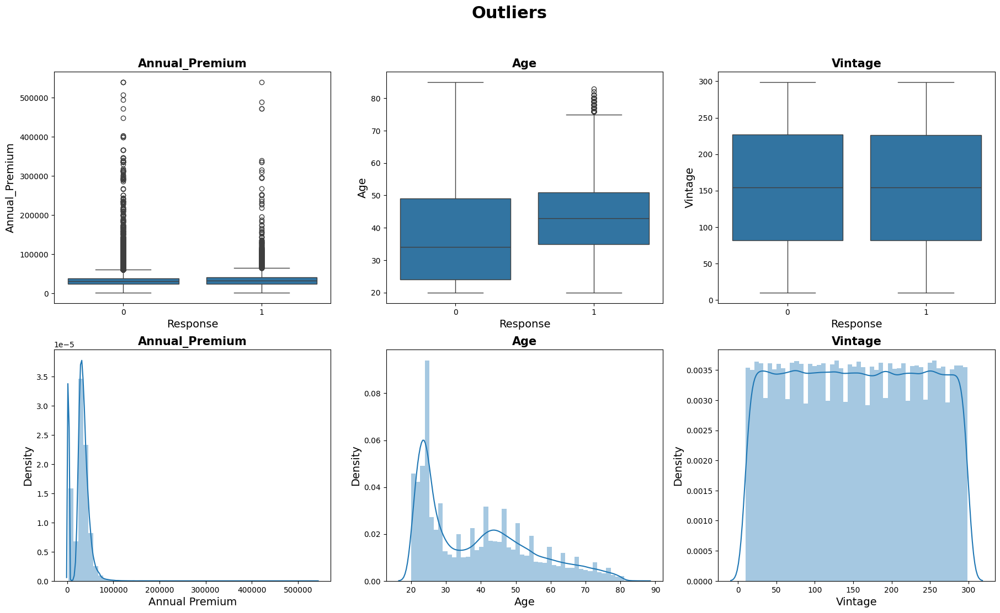

In [ ]:
def show_outliers(data_df):

    fig, axes = plt.subplots(2, 3, figsize=(22,12))

    sns.boxplot(ax = axes[0][0], y = 'Annual_Premium', x = 'Response', data = data_df)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][1], y = 'Age', x = 'Response', data = data_df)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    axes[0][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][2], y = 'Vintage', x = 'Response', data = data_df)
    axes[0][2].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][0], x = data_df['Annual_Premium'])
    axes[1][0].set_xlabel(xlabel = 'Annual Premium', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][1], x = data_df['Age'])
    axes[1][1].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][2], x = data_df['Vintage'])
    axes[1][2].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Outliers', fontsize = 22, fontweight = 'bold' )

show_outliers(data_df)

From the above plot it can be drawn that Annual Premium has a positively skewed distribution.
From above, we can also deduce that Vintage shows approximate uniform distribution.
Age columns has some outliers but we are not going to treat them because it won't be affecting our result.

In [ ]:
def outlier_treatment(data_df):
    Q1=data_df['Annual_Premium'].quantile(0.25)
    Q3=data_df['Annual_Premium'].quantile(0.75)
    IQR=Q3-Q1

    Lower_Whisker = Q1-1.5*IQR
    Upper_Whisker = Q3+1.5*IQR
    data_df['Annual_Premium_Treated'] = np.where(data_df['Annual_Premium'] > Upper_Whisker, Upper_Whisker, data_df['Annual_Premium'])

def scale_features(data_df):
    scaler = MinMaxScaler()

    data_df['Annual_Premium_Treated'] = scaler.fit_transform(data_df['Annual_Premium_Treated'].values.reshape(-1,1))
    data_df['Vintage_Treated'] = scaler.fit_transform(data_df['Vintage'].values.reshape(-1,1))

outlier_treatment(data_df)
scale_features(data_df)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Create a copy to preserve original data
df_processed = data_df.copy()

# Label Encoding for binary object columns
label_enc_cols = ['Gender', 'Vehicle_Damage']
le = LabelEncoder()
for col in label_enc_cols:
    df_processed[col] = le.fit_transform(df_processed[col])

# Ordinal encoding for Vehicle_Age (manual mapping)
vehicle_age_map = {'< 1 Year': 0, '1-2 Year': 1, '> 2 Years': 2}
df_processed['Vehicle_Age'] = df_processed['Vehicle_Age'].map(vehicle_age_map)

# Drop ID column (not useful for prediction)
df_processed.drop(columns=['id'], inplace=True)

#Printing the pre-processed data
print(df_processed.head())

# Quick statistical summary after preprocessing
df_processed.describe(include='all')

print(df_processed.dtypes)

   Gender  Age  Driving_License  Region_Code  Previously_Insured  Vehicle_Age  \
0       1   44                1           28                   0            2   
1       1   76                1            3                   0            1   
2       1   47                1           28                   0            2   
3       1   21                1           11                   1            0   
4       0   29                1           41                   1            0   

   Vehicle_Damage  Annual_Premium  Policy_Sales_Channel  Vintage  Response  \
0               1           40454                    26      217         1   
1               0           33536                    26      183         0   
2               1           38294                    26       27         1   
3               0           28619                   152      203         0   
4               0           27496                   152       39         0   

   Annual_Premium_Treated  Vintage_Treated  

###Exploratory Data Analysis###

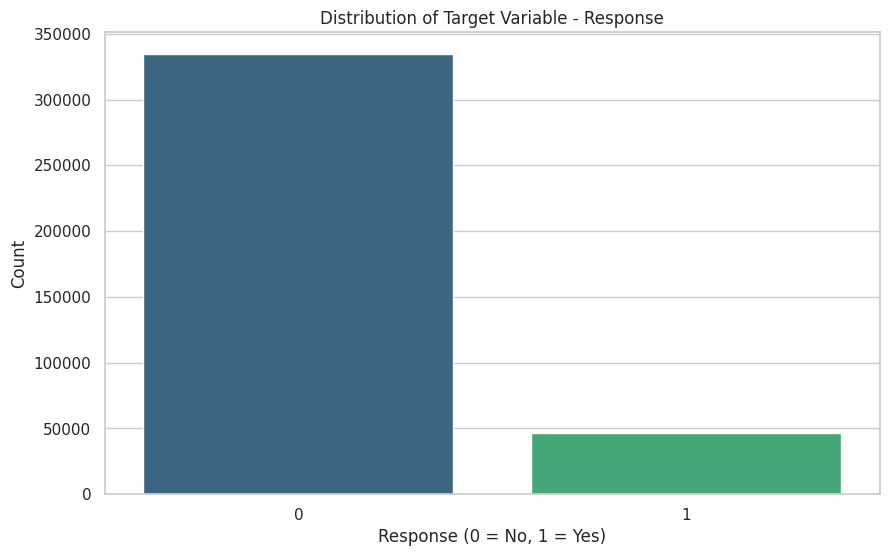

In [ ]:
# Conducting Exploratory Data Analysis (EDA)
# Setup for graphs and plotting
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)

# 1. Target variable distribution
plt.figure()
sns.countplot(x='Response', data=df_processed, palette='viridis')
plt.title("Distribution of Target Variable - Response")
plt.xlabel("Response (0 = No, 1 = Yes)")
plt.ylabel("Count")
plt.show()

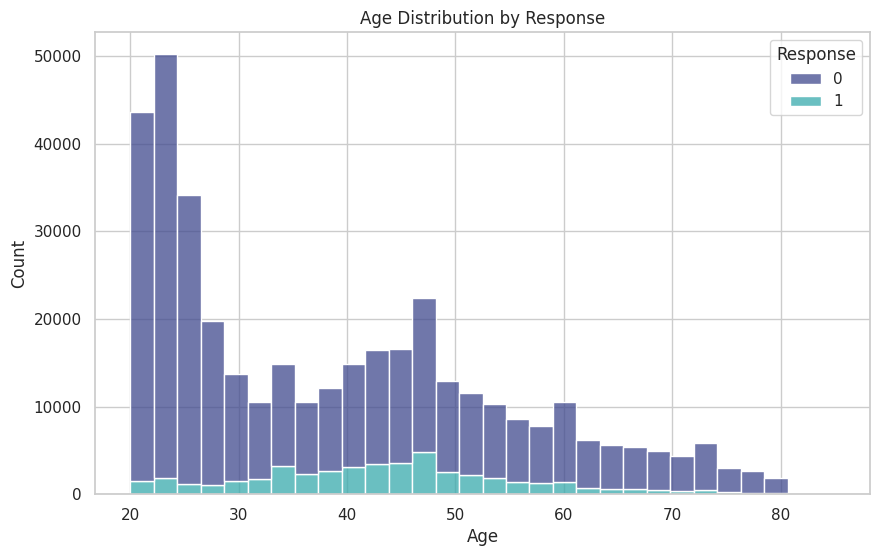

In [ ]:
# 2. Age vs Response
plt.figure()
sns.histplot(data=df_processed, x="Age", hue="Response", multiple="stack", bins=30, palette='mako')
plt.title("Age Distribution by Response")
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()


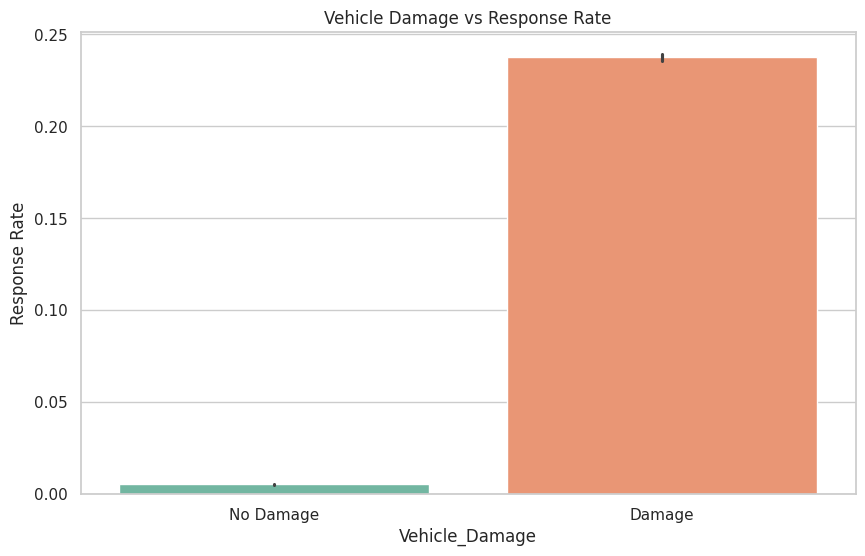

In [ ]:
# 3. Vehicle Damage vs Response
plt.figure()
sns.barplot(x="Vehicle_Damage", y="Response", data=df_processed, palette='Set2')
plt.title("Vehicle Damage vs Response Rate")
plt.xticks([0, 1], ["No Damage", "Damage"])
plt.ylabel("Response Rate")
plt.show()

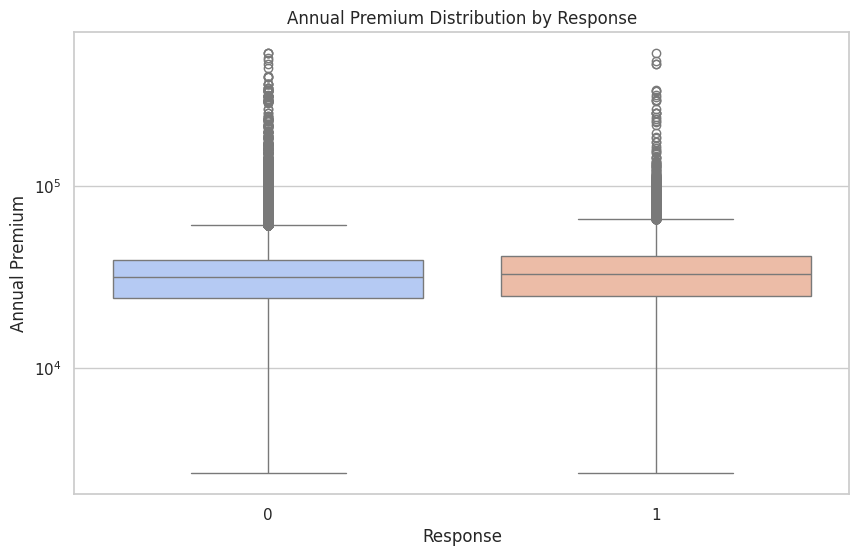

In [ ]:
# 4. Annual Premium vs Response
plt.figure()
sns.boxplot(x='Response', y='Annual_Premium', data=df_processed, palette='coolwarm')
plt.title("Annual Premium Distribution by Response")
plt.xlabel("Response")
plt.ylabel("Annual Premium")
plt.yscale("log")  # log scale due to wide range
plt.show()


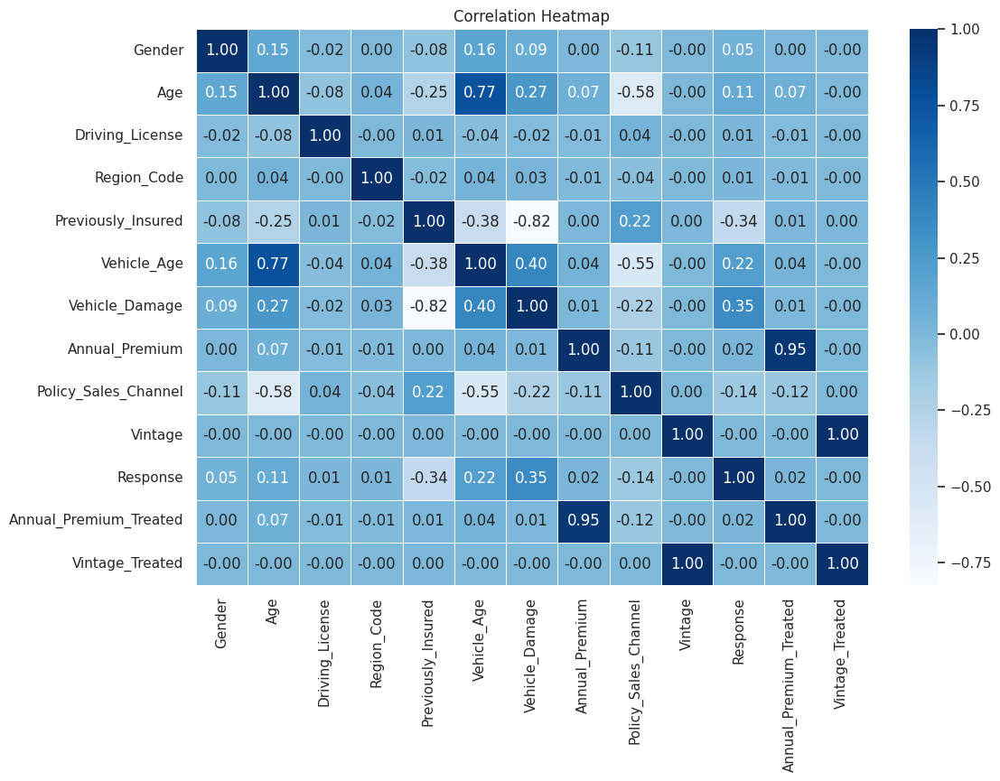

In [ ]:
# 5. Correlation Heatmap
plt.figure(figsize=(12, 8))
corr = df_processed.corr()
sns.heatmap(corr, annot=True, cmap='Blues', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

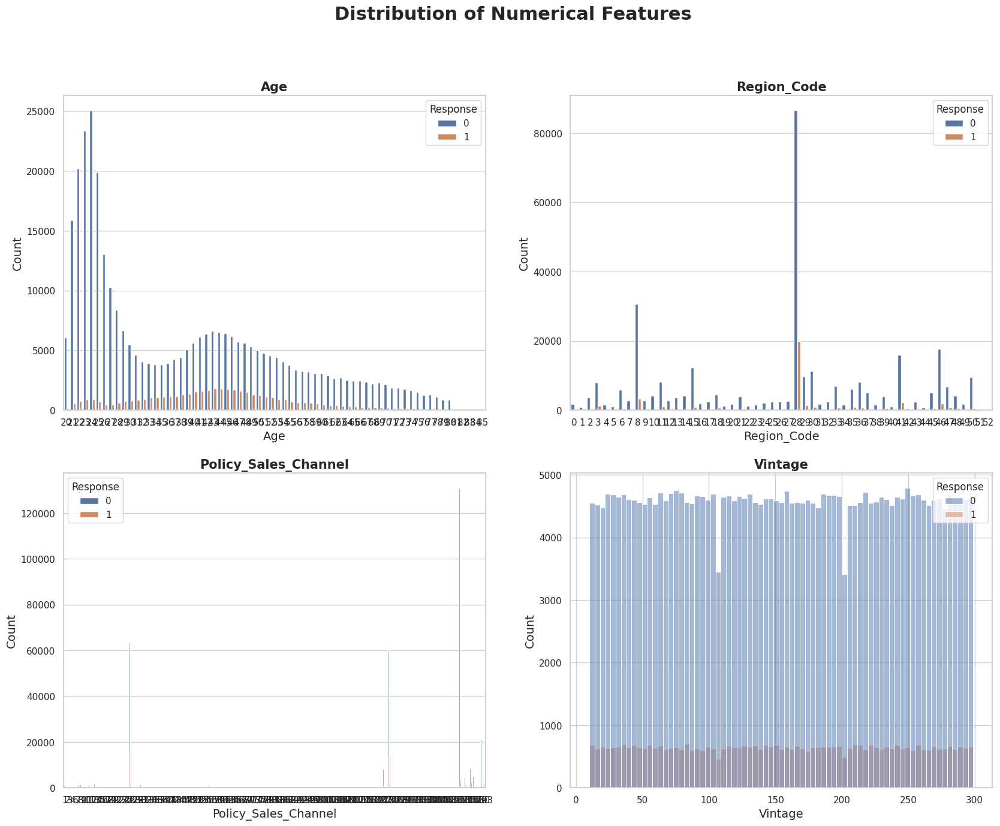

In [ ]:
def show_distribution_numerical_features(df_processed):
    fig, axes = plt.subplots(2,2, figsize=(20,15))

    sns.countplot(ax = axes[0][0],x = 'Age', data = df_processed, hue='Response')
    axes[0][0].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0][0].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[0][1],x = 'Region_Code', data = df_processed, hue='Response')
    axes[0][1].set_xlabel(xlabel = 'Region_Code', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0][1].set_title('Region_Code',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[1][0],x = 'Policy_Sales_Channel', data = df_processed, hue='Response')
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][0].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.histplot(ax = axes[1][1], x = df_processed['Vintage'], data = df_processed, hue='Response')
    axes[1][1].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vintage',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Distribution of Numerical Features', fontsize = 22, fontweight = 'bold' )

show_distribution_numerical_features(df_processed)

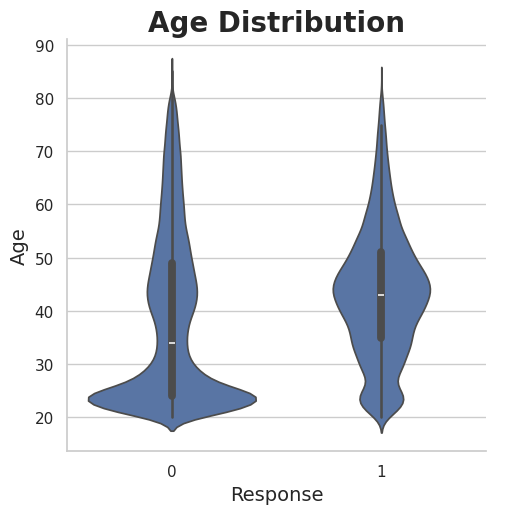

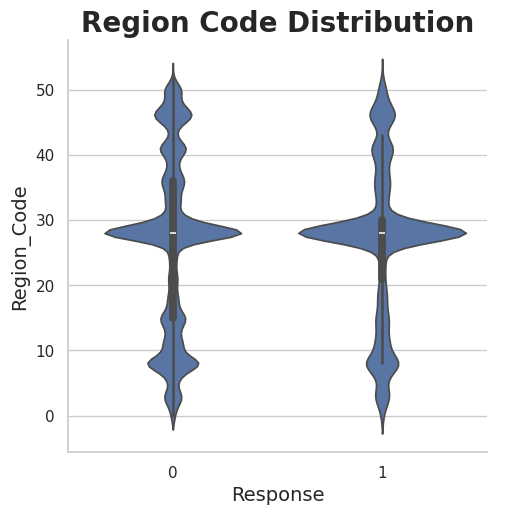

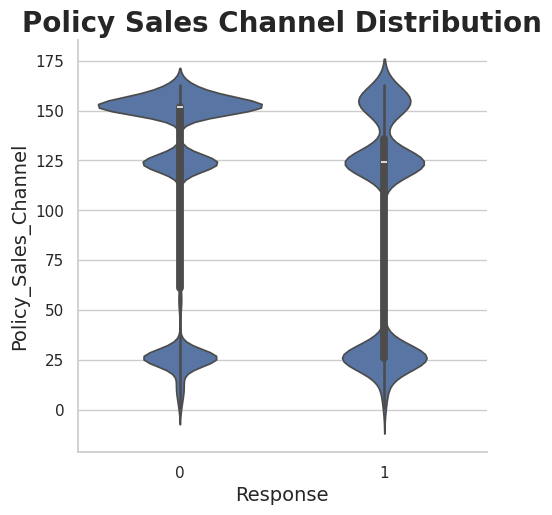

In [ ]:
def show_violin_distribution(df_processed):

    sns.catplot(y = 'Age', data = df_processed, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    plt.title('Age Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 'Region_Code', data = df_processed, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Region_Code', fontdict={'fontsize': 14})
    plt.title('Region Code Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 'Policy_Sales_Channel', data = df_processed, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Policy_Sales_Channel', fontdict={'fontsize': 14})
    plt.title('Policy Sales Channel Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

show_violin_distribution(df_processed)

In [ ]:
def convert_numerical_to_categorical(df_processed):
    # Age Grouping
    df_processed['Age_Group'] = df_processed['Age'].apply(
        lambda x: 'YoungAge' if 20 <= x <= 45 else 'MiddleAge' if x <= 65 else 'OldAge'
    )

    # Policy Sales Channel Grouping based on channel ID (not frequency)
    df_processed['Policy_Sales_Channel_Categorical'] = df_processed['Policy_Sales_Channel'].apply(
        lambda x: 'Channel_A' if x in range(1, 11) else
                  'Channel_B' if x in range(11, 31) else
                  'Channel_C' if x in range(31, 51) else
                  'Channel_D'
    )

    # Region Code Grouping based on region code itself
    df_processed['Region_Code_Categorical'] = df_processed['Region_Code'].apply(
        lambda x: 'Region_A' if x in range(0, 10) else
                  'Region_B' if x in range(10, 30) else
                  'Region_C'
    )

convert_numerical_to_categorical(df_processed)

print(df_processed['Age_Group'].value_counts())
print(df_processed['Policy_Sales_Channel_Categorical'].value_counts())
print(df_processed['Region_Code_Categorical'].value_counts())


Age_Group
YoungAge     257344
MiddleAge     95696
OldAge        28069
Name: count, dtype: int64
Policy_Sales_Channel_Categorical
Channel_D    282306
Channel_B     91775
Channel_A      5659
Channel_C      1369
Name: count, dtype: int64
Region_Code_Categorical
Region_B    187416
Region_C    127758
Region_A     65935
Name: count, dtype: int64


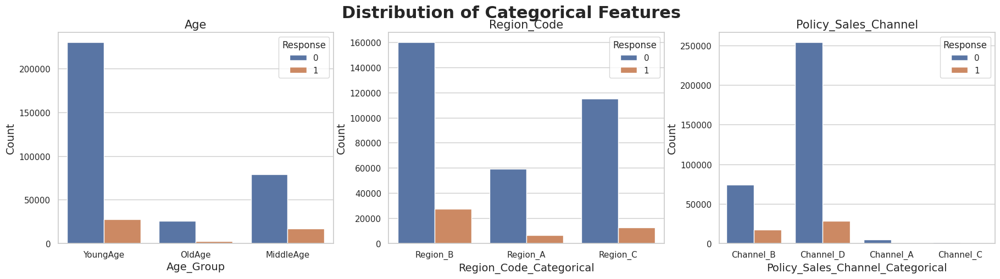

In [ ]:
def show_distribution_num_to_cat(df_processed):
    fig, axes = plt.subplots(1,3, figsize=(22,5))

    sns.countplot(ax = axes[0],x = 'Age_Group', data = df_processed, hue='Response')
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age', fontdict={'fontsize': 15})

    sns.countplot(ax = axes[1],x = 'Region_Code_Categorical', data = df_processed, hue='Response')
    axes[1].set_xlabel(xlabel = 'Region_Code_Categorical', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Region_Code',fontdict={'fontsize': 15})

    sns.countplot(ax = axes[2],x = 'Policy_Sales_Channel_Categorical', data = df_processed, hue='Response')
    axes[2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[2].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15})

    plt.suptitle('Distribution of Categorical Features', fontsize = 22, fontweight = 'bold' )

show_distribution_num_to_cat(df_processed)

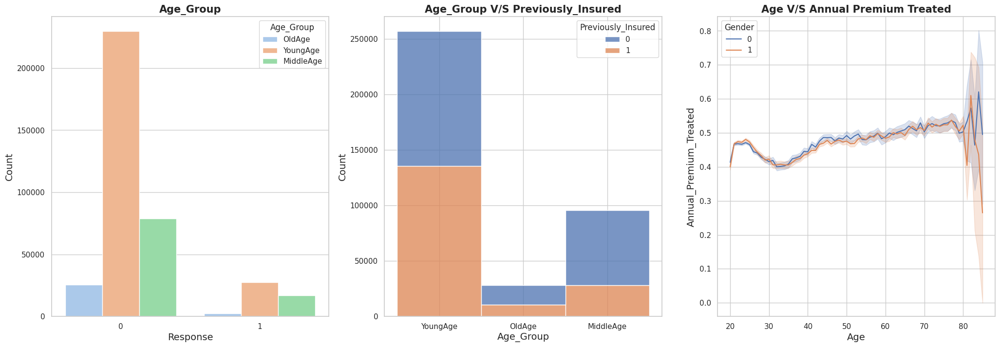

In [ ]:
def show_age_relations(df_processed):
    fig, axes = plt.subplots(1,3, figsize=(25,8))
    sns.countplot(ax = axes[0],x="Response", hue="Age_Group", palette="pastel",
            data=df_processed)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1],binwidth=0.5, x="Age_Group",
                 hue="Previously_Insured", data=df_processed,
                 stat="count", multiple="stack")
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Age_Group V/S Previously_Insured', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.lineplot(ax = axes[2], x="Age",y="Annual_Premium_Treated",
                 data=df_processed,hue="Gender")
    axes[2].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[2].set_title('Age V/S Annual Premium Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_age_relations(df_processed)


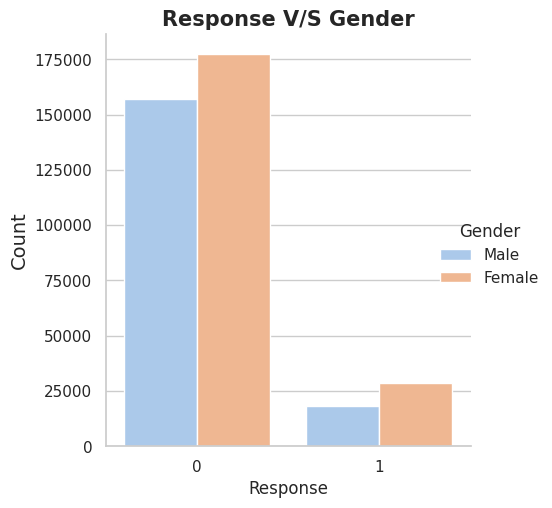

In [ ]:
def show_gender_response_relation(df_processed):
    g = sns.catplot(x="Response", hue="Gender", kind="count",
                palette="pastel",
                data=df_processed,)
    plt.xlabel('Response', fontdict={'fontsize':12})
    plt.ylabel('Count',fontdict={'fontsize': 14})
    plt.title('Response V/S Gender', fontdict={'fontsize': 15, 'fontweight':'bold'})
    # Customize the legend
    new_labels = ['Male', 'Female']  # Or use ['Female', 'Male'] depending on data
    # Set axis labels and title
    g.set_axis_labels('Response', 'Count')
    g._legend.set_title("Gender")
    for t, l in zip(g._legend.texts, new_labels):
        t.set_text(l)
    plt.show()

show_gender_response_relation(df_processed)

In [ ]:
def vehicle_damage_distribution(df_processed):
    fig = px.pie(df_processed, values='Response', names='Vehicle_Damage', title='Vehicle Damage Distribution')
    plt.figure(figsize=(5, 8))
    fig.show()

vehicle_damage_distribution(df_processed)

# def vehicle_damage_distribution(df_processed):
#     # Count occurrences of each Vehicle_Damage category
#     damage_counts = df_processed['Vehicle_Damage'].value_counts().reset_index()
#     damage_counts.columns = ['Vehicle_Damage', 'Count']

#     # Plot with Plotly Express
#     fig = px.pie(damage_counts,
#                  values='Count',
#                  names='Vehicle_Damage',
#                  title='Vehicle Damage Distribution',
#                  color_discrete_sequence=px.colors.sequential.RdBu)
#     fig.update_traces(textposition='inside', textinfo='percent+label')
#     fig.show()

# vehicle_damage_distribution(df_processed)


<Figure size 500x800 with 0 Axes>

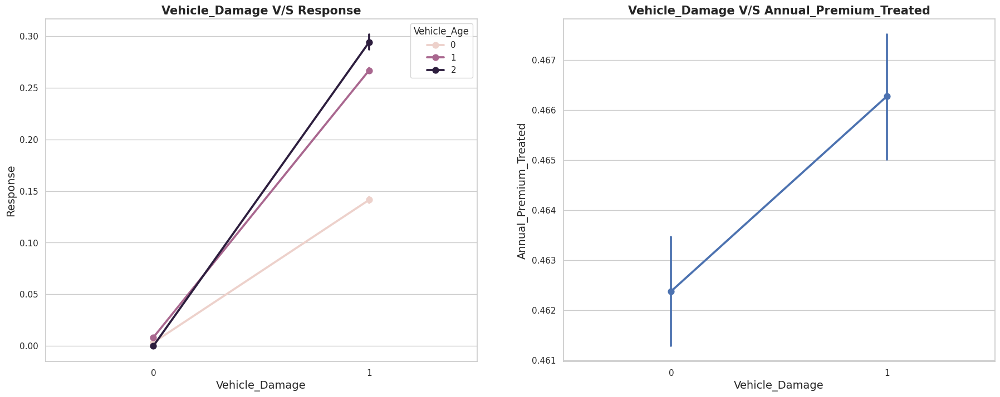

In [ ]:
def show_vehicle_damage_relations(df_processed):
    fig, axes = plt.subplots(1,2, figsize=(22,8))
    sns.pointplot(ax = axes[0], x="Vehicle_Damage", y="Response", hue="Vehicle_Age", data=df_processed)
    axes[0].set_xlabel(xlabel = 'Vehicle_Damage', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_title('Vehicle_Damage V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(x = 'Vehicle_Damage', y = 'Annual_Premium_Treated', data=df_processed)
    axes[1].set_xlabel(xlabel = 'Vehicle_Damage', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Vehicle_Damage V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_vehicle_damage_relations(df_processed)


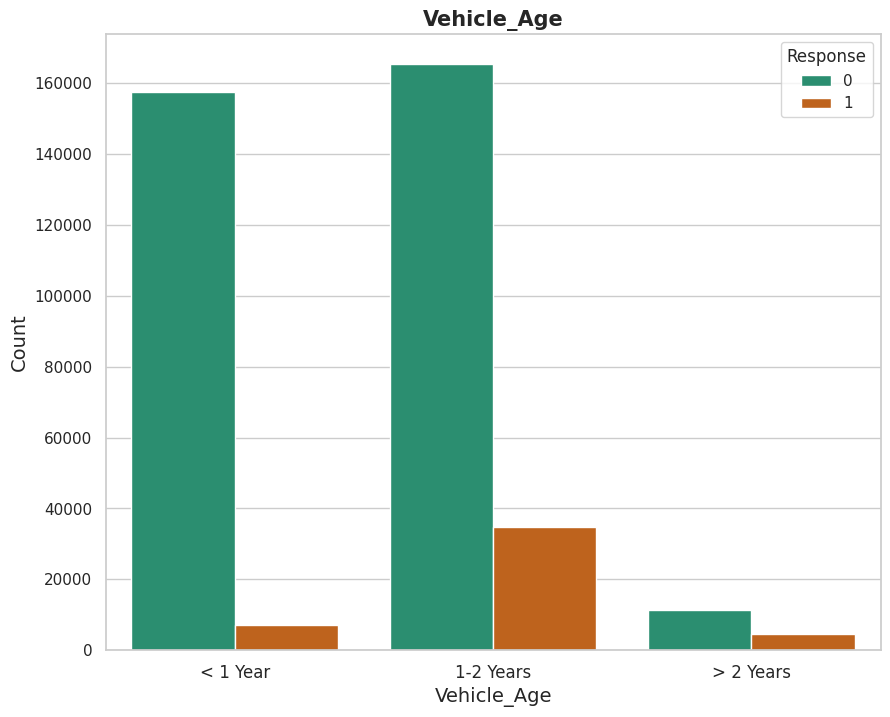

In [ ]:
def vehicle_age_distribution(df_processed):
    plt.figure(figsize=(10, 8))
    ax_va = sns.countplot(x = 'Vehicle_Age', hue='Response', data = df_processed, palette="Dark2")
    plt.xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    plt.title('Vehicle_Age', fontdict={'fontsize': 15, 'fontweight':'bold'})
    # Set custom tick labels
    ax_va.set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)
    plt.show()

vehicle_age_distribution(df_processed)

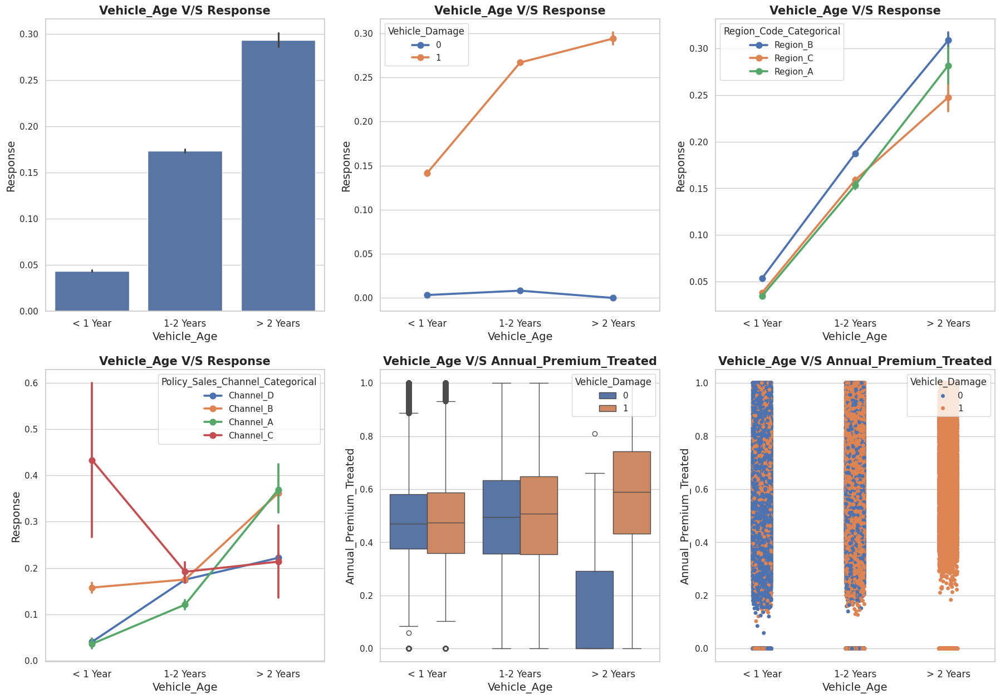

In [ ]:
def show_vehicle_age_relation(df_processed):
    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.barplot(ax = axes[0][0], x = 'Vehicle_Age', y='Response', data = df_processed)
    axes[0][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[0][0].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

    sns.pointplot(ax = axes[0][1], y = 'Response', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data = df_processed)
    axes[0][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[0][1].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

    sns.pointplot(ax = axes[0][2], y = 'Response', x = 'Vehicle_Age', hue = 'Region_Code_Categorical', data = df_processed)
    axes[0][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[0][2].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

    sns.pointplot(ax = axes[1][0], y = 'Response', x = 'Vehicle_Age', hue = 'Policy_Sales_Channel_Categorical', data = df_processed)
    axes[1][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[1][0].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

    sns.boxplot(ax = axes[1][1], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data= df_processed)
    axes[1][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[1][1].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

    sns.stripplot(ax = axes[1][2], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data = df_processed)
    axes[1][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})
    axes[1][2].set_xticklabels(["< 1 Year", "1-2 Years", "> 2 Years"], fontsize=12)

show_vehicle_age_relation(df_processed)


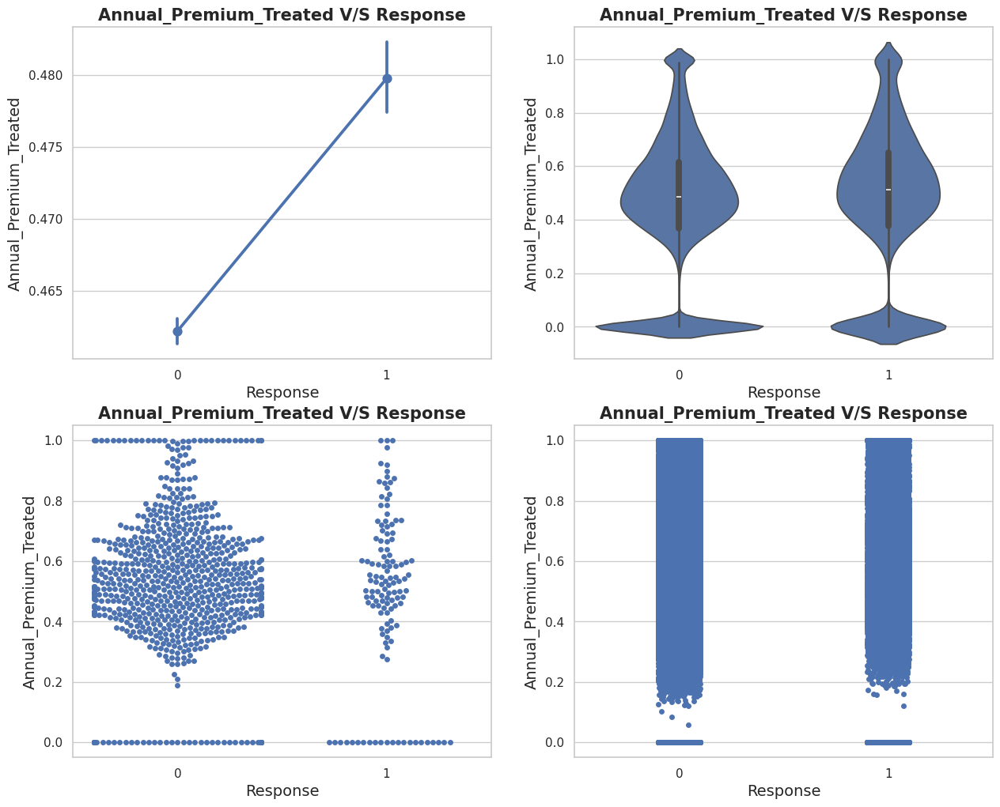

In [ ]:
def show_annual_premium_relation(df_processed):
    fig, axes = plt.subplots(2,2, figsize=(15,12))

    sns.pointplot(ax = axes[0][0], x = 'Response', y = 'Annual_Premium_Treated', data = df_processed)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[0][1], x = 'Response', y = 'Annual_Premium_Treated', data = df_processed)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.swarmplot(ax = axes[1][0], x = 'Response', y = 'Annual_Premium_Treated', data = df_processed[:1000])
    axes[1][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][1], x = 'Response', y = 'Annual_Premium_Treated', data = df_processed)
    axes[1][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_annual_premium_relation(df_processed)

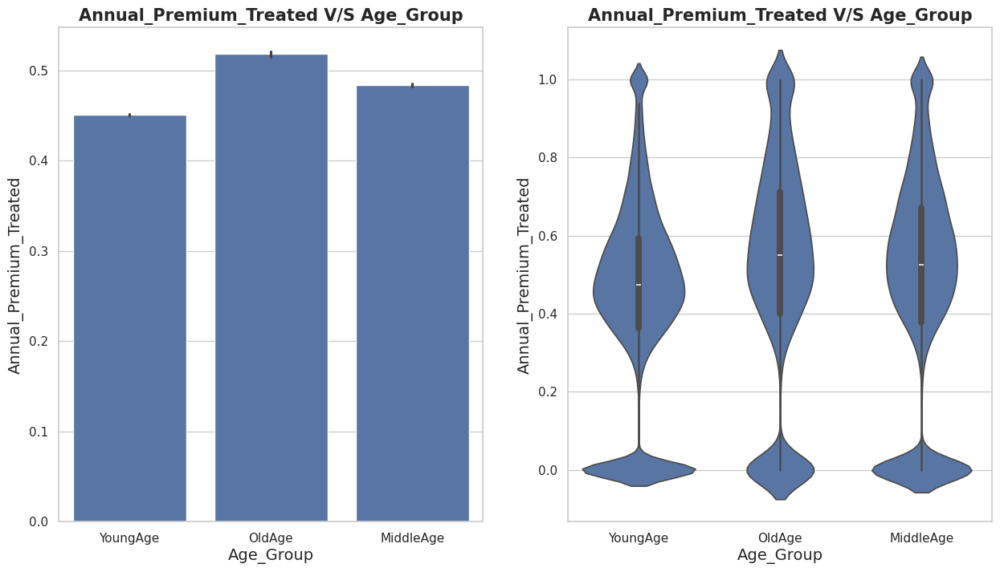

In [ ]:
def show_annual_premium_with_age_group(df_processed):
    fig, axes = plt.subplots(1,2, figsize=(15,8))

    sns.barplot(ax = axes[0],y = 'Annual_Premium_Treated', x = 'Age_Group', data = df_processed)
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[1], y = 'Annual_Premium_Treated', x = 'Age_Group', data = df_processed)
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_annual_premium_with_age_group(df_processed)


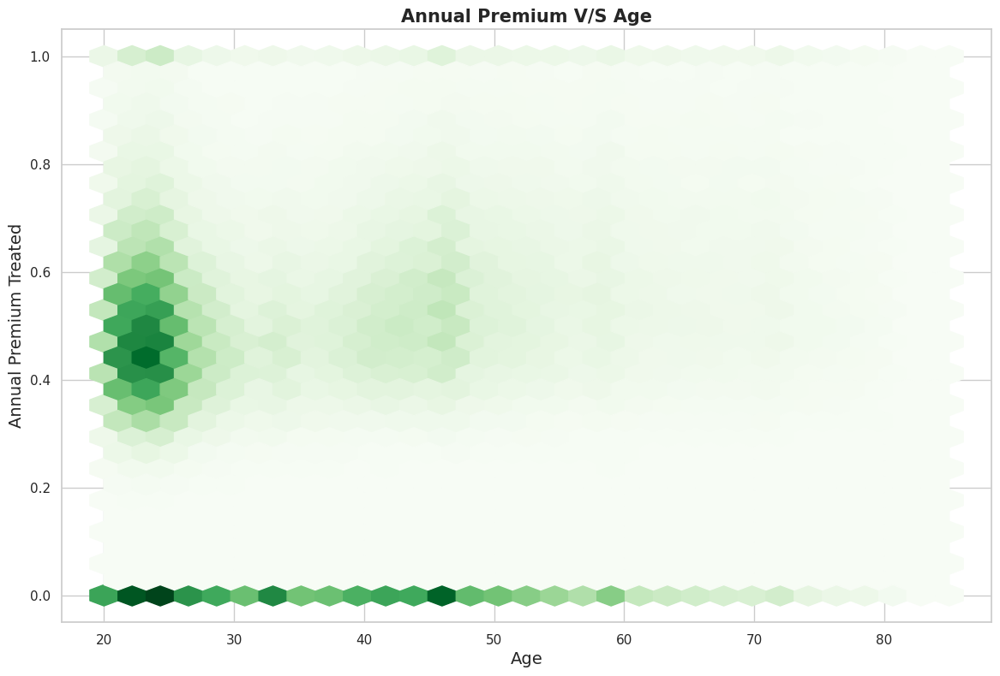

In [ ]:
def show_age_annual_premium_relation(df_processed):

    plt.figure(figsize = (14,9))
    plt.hexbin(data=df_processed, x='Age',y='Annual_Premium_Treated',gridsize = 30, cmap ='Greens')
    plt.title('Annual Premium V/S Age', fontdict={'fontsize': 15, 'fontweight':'bold'})
    plt.ylabel('Annual Premium Treated',fontdict={'fontsize': 14})
    plt.xlabel('Age', fontdict={'fontsize': 14})
    plt.show()


    fig = px.scatter(df_processed, x="Age", y="Annual_Premium",
                    color="Region_Code_Categorical",
                    size_max=180,opacity=0.3, title='Age V/S Annual Premium')
    fig.show()

show_age_annual_premium_relation(df_processed)

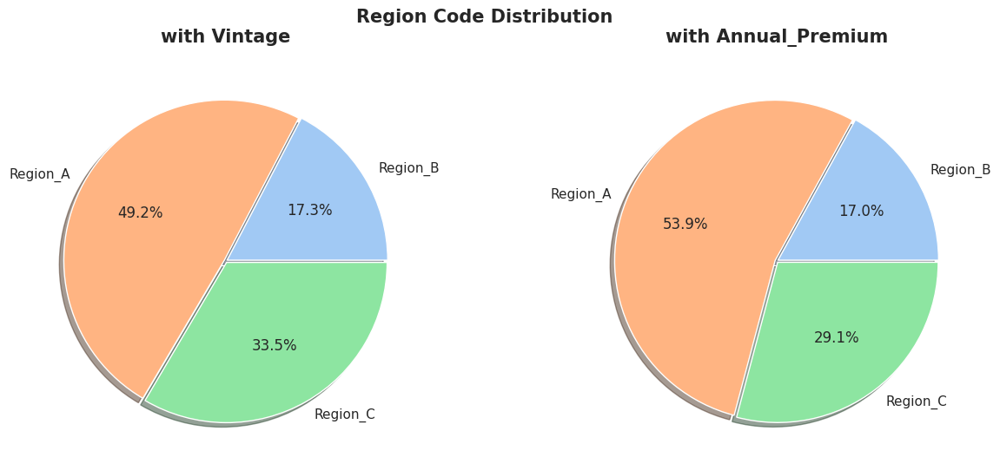

In [ ]:
def show_region_code_distribution(df_processed):

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.01, 0.01)

    fig, axes = plt.subplots(1,2, figsize=(15,6))
    axes[0].pie(x=df_processed.groupby('Region_Code_Categorical')['Vintage'].sum(),explode=explode,
                labels=df_processed['Region_Code_Categorical'].unique(), colors=colors,autopct='%1.1f%%',
                shadow=True);
    axes[0].set_title('with Vintage', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=df_processed.groupby('Region_Code_Categorical')['Annual_Premium_Treated'].sum(),explode=explode,
                labels=df_processed['Region_Code_Categorical'].unique(), colors=colors, autopct='%1.1f%%',
                shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Region Code Distribution',fontsize = 15, fontweight ='bold')

show_region_code_distribution(df_processed)

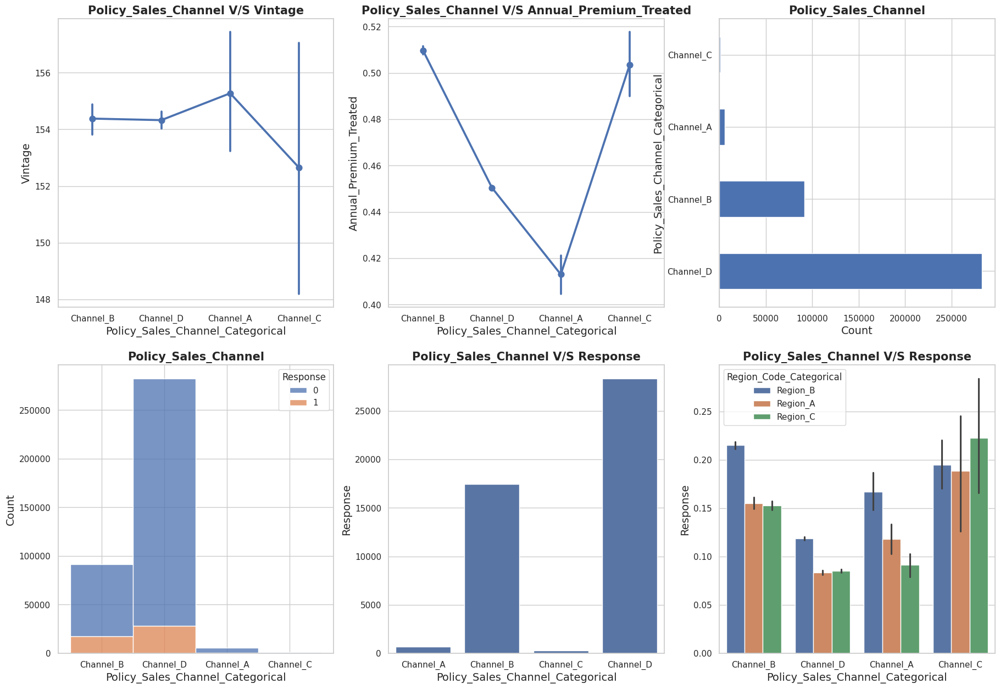

In [ ]:
def show_policy_sales_channel_relation(df_processed):

    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.pointplot(ax = axes[0][0], x='Policy_Sales_Channel_Categorical', y='Vintage',data=df_processed)
    axes[0][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][0].set_title('Policy_Sales_Channel V/S Vintage',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], x='Policy_Sales_Channel_Categorical', y='Annual_Premium_Treated',data=df_processed)
    axes[0][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Policy_Sales_Channel V/S Annual_Premium_Treated',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    df_processed['Policy_Sales_Channel_Categorical'].value_counts().plot(ax = axes[0][2] ,kind='barh')
    axes[0][2].set_xlabel(xlabel = 'Count', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][2].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1][0],x="Policy_Sales_Channel_Categorical", hue="Response", data=df_processed, stat="count",
                 multiple="stack",binwidth=0.5)
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][0].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})

    groupPolicySalesBySum = df_processed.groupby(by=["Policy_Sales_Channel_Categorical"]).sum().reset_index()
    sns.barplot(ax = axes[1][1], x="Policy_Sales_Channel_Categorical", y="Response", data=groupPolicySalesBySum)
    axes[1][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.barplot(ax = axes[1][2], x='Policy_Sales_Channel_Categorical', y='Response', data=df_processed, hue='Region_Code_Categorical')
    axes[1][2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][2].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_policy_sales_channel_relation(df_processed)

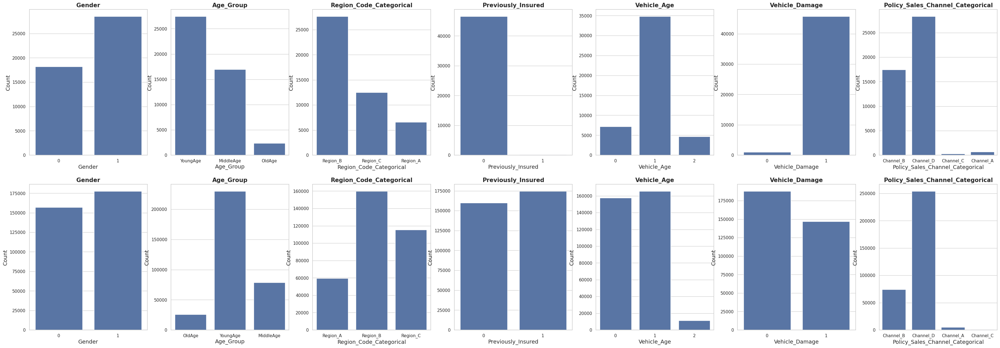

In [ ]:
def count_each_categorical_feature(df_processed):
    categorical_columns = ['Gender', 'Age_Group', 'Region_Code_Categorical', 'Previously_Insured', 'Vehicle_Age','Vehicle_Damage', 'Policy_Sales_Channel_Categorical']

    fig, axes =  plt.subplots(2, 7, figsize=(45, 15))
    for i in range(7):
        sns.countplot(data = df_processed[df_processed['Response']==1], x=categorical_columns[i], ax=axes[0][i])
        axes[0][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[0][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[0][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

        sns.countplot(data = df_processed[df_processed['Response']==0], x=categorical_columns[i], ax=axes[1][i])

        axes[1][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[1][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[1][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

count_each_categorical_feature(df_processed)

✅ EDA Results Summary
1. 📊 Target Variable – Response -

- Highly imbalanced data: Only ~12% responded positively (1), rest declined (0). It is therefore very clear that the data is highly imbalanced.

- The data is for the considerable major part leaning towards the "No" feature class. This sort of data behaviour indicates need for techniques like SMOTE, class weights, or stratified sampling, so as to maintain a balance between the largely imbalanced feature classes in the response (0 - No and 1 - Yes).

2. 👤 Age Distribution by Response -

- Customers aged between 25 to 60 show the highest engagement.
- Density of affirmative responses ('Yes') are mostly exhibited by the age groups of 40-50 and responses in negative ('No') are mostly driven by respondents belonging to age group of 20-30
- Young (<25) and very old (>70) show low response.
- The age group (20-25 years) make up the entirety of mid-sized annual premium ticket pool (₹30k–₹40k).

3. 🚗 Vehicle Damage vs Response -

- Customers who had prior vehicle damage are far more likely to opt in.
- An overwhelming 97.9% of respondents experiencing prior vehicle damage have responded 'Yes' to insurance, while only 2% of respondents who have not experienced any vehicle damage say 'No' to insurance.
- Strong positive correlation observed here.

4. 💰 Annual Premium vs Response -

- Distribution is right-skewed with high outliers.
- Majority of the respondents belong to mid-sized ticket pool (annual premium distribution)
- People across premium ranges opt in, but premiums around ₹30k–₹40k show more positive responses. We applied log-scaling in the graph for convenient visualization due to wide premium spread.

5. Vehicle Age to Response -

- Majority of the respondents who have purchased/ or possess vehicles in their first operational year have responded with a 'No', a trend which is opposite to that of respondents owning vehicles with increased operational age.
- Respondents possessing vehicles with operation tenure of more than 2 years responded with a 'Yes' to insurance

6. Other Observations -

- Region B makes up the most sizeable distribution with respect to number of vintage days, thereby exhibiting the strongest customer loyalty trait.
- Least response activity was observed in Policy Sales Channel A's efforts.

📈 Correlation Heatmap -

Strongest correlations:
- Vehicle_Damage & Response → positive
- Previously_Insured & Response → negative (i.e., already insured → less likely to buy again)

Annual_Premium, Vintage show weak correlations with target variable (response)



*So, here we are done with the Data Cleaning, Outlier Detection, Feature Scaling and EDA of our dataset. Let's proceed with training the dataset on different Machine Learning Algorithms.*

In [ ]:
df_processed.columns

Index(['Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Annual_Premium_Treated',
       'Vintage_Treated', 'Age_Group', 'Policy_Sales_Channel_Categorical',
       'Region_Code_Categorical'],
      dtype='object')

In [ ]:
print(df_processed)

        Gender  Age  Driving_License  Region_Code  Previously_Insured  \
0            1   44                1           28                   0   
1            1   76                1            3                   0   
2            1   47                1           28                   0   
3            1   21                1           11                   1   
4            0   29                1           41                   1   
...        ...  ...              ...          ...                 ...   
381104       1   74                1           26                   1   
381105       1   30                1           37                   1   
381106       1   21                1           30                   1   
381107       0   68                1           14                   0   
381108       1   46                1           29                   0   

        Vehicle_Age  Vehicle_Damage  Annual_Premium  Policy_Sales_Channel  \
0                 2               1           

In [ ]:
# Dropping Unnecessary Columns
cols_to_drop = ['Age', 'Driving_License',
                'Region_Code', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage']
df_processed.drop(columns = cols_to_drop, inplace = True)

# **Feature Selection**

---

## **Numeric Feature Selection**

Let's see the Kendall's correlation between numerical features.

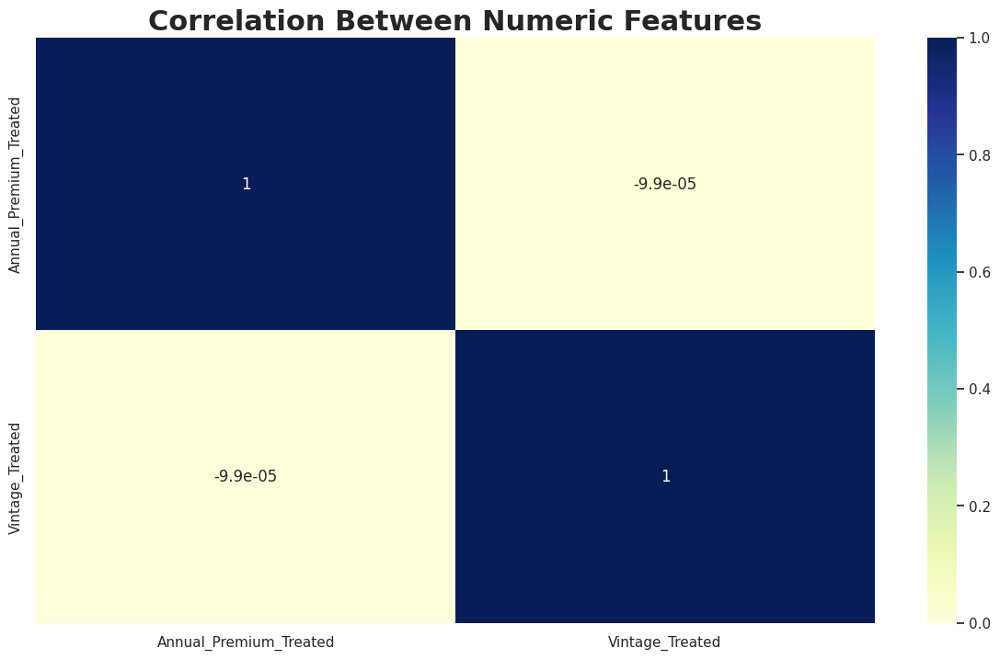

In [ ]:
def numeric_feature_selection(df):
    plt.rcParams['figure.figsize'] = 14.7,8.27
    numeric_features = ['Annual_Premium_Treated','Vintage_Treated']

    sns.heatmap(df[numeric_features].corr(method = 'kendall'),
                cmap="YlGnBu",annot=True)
    plt.title('Correlation Between Numeric Features', fontdict={'fontsize':22,'fontweight':'bold'})

numeric_feature_selection(df_processed)

We have got two numeric features - Annual_Premium_Treated and Vintage_Treated

*   There is no correlation between these two features, as a result we are going to move forward with both of them.


## **Categorical Features**

Let's see the feature importance of categorical features.

In [ ]:
categorical_features = ['Gender','Age_Group','Region_Code_Categorical','Previously_Insured',
                        'Vehicle_Age','Vehicle_Damage','Policy_Sales_Channel_Categorical']

In [ ]:
def make_features_numeric(df):
    global numeric_df
    numeric_df = df_processed.copy()
    numeric_df['Gender'] = numeric_df['Gender'].apply(lambda x: 1 if x == 'Male' else 0)
    numeric_df['Age_Group'] = numeric_df['Age_Group'].apply(lambda x: 1 if x == 'YoungAge' else 2 if x == 'MiddleAge' else 3)
    numeric_df['Vehicle_Age'] = numeric_df['Vehicle_Age'].apply(lambda x: 1 if x == 'New' else 2 if x == 'Latest' else 3)
    numeric_df['Vehicle_Damage'] = numeric_df['Vehicle_Damage'].apply(lambda x: 0 if x == 'Y' else 1)
    numeric_df['Policy_Sales_Channel_Categorical'] = numeric_df['Policy_Sales_Channel_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3 if x=='C' else 4)
    numeric_df['Region_Code_Categorical'] = numeric_df['Region_Code_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3)

make_features_numeric(df_processed)

### **Mutual Information**
Mutual information is one of many quantities that measures how much one random variables tells us about another.

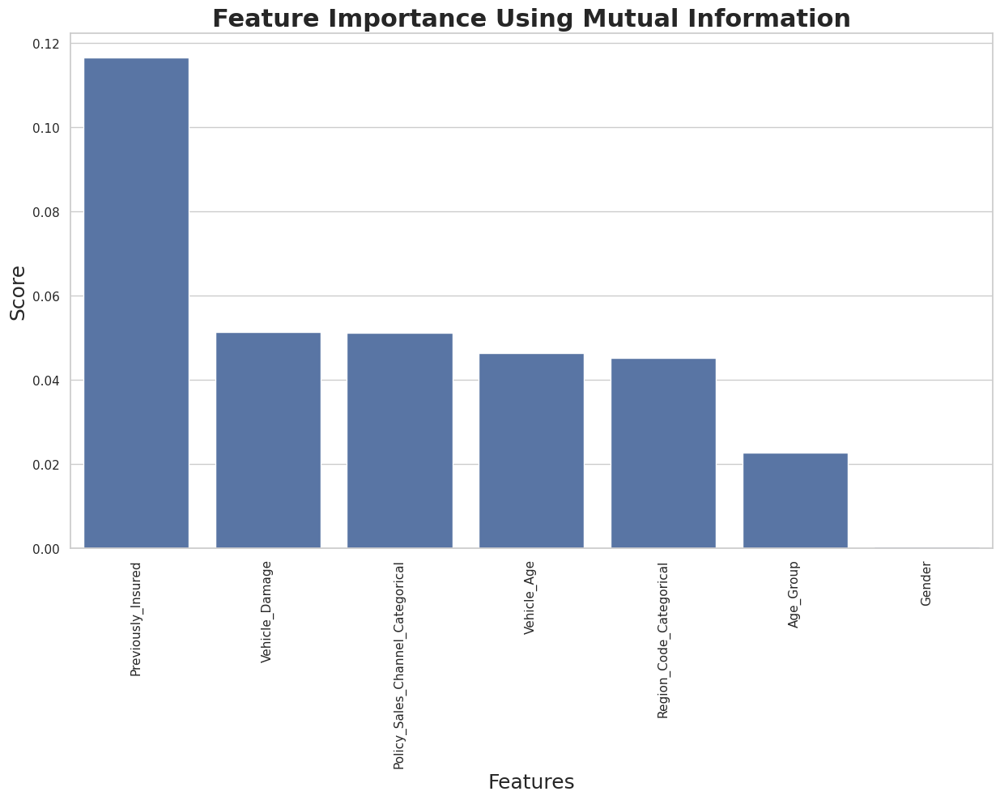

In [ ]:
def mutual_info(df_processed):
    X = df_processed.copy()
    y = X.pop("Response")
    X.drop(columns = ['Annual_Premium_Treated','Vintage_Treated'], inplace = True)

    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=0.3)

    high_score_features = []
    feature_scores = mutual_info_classif( x_train, y_train,  random_state=0)

    column_score = {}
    columns = []
    scores = []
    for score, f_name in sorted(zip(feature_scores, x_train.columns), reverse=True):
        columns.append(f_name)
        scores.append(score)
        high_score_features.append(f_name)

    column_score['Feature'] = columns
    column_score['Score'] = scores

    return pd.DataFrame(data = column_score)

def show_feature_importance_through_mi(df_processed):
    sns.barplot(data = mutual_info(df_processed), x = 'Feature', y='Score')
    plt.title('Feature Importance Using Mutual Information', fontdict={'fontsize':22,'fontweight':'bold'})
    plt.xlabel('Features', fontdict={'fontsize':18})
    plt.ylabel('Score', fontdict={'fontsize':18})
    plt.xticks(rotation=90)

show_feature_importance_through_mi(numeric_df)

- From the above bar plot, we can conclude Previously_Insured is the most important feature and has the highest impact on dependent feature.

# **One-Hot Encoding**
---

One hot encoding is a process by which categorical variables are converted into a form that could be provided to ML algorithms to do a better job in prediction.

When there is not a ordinal relationship between variables, we use One-Hot Encoding. With One-Hot Encoding the model doesn't assume a natural ordering between categories which may result in poor performance or unexpected results.

In [ ]:
df_processed.columns

Index(['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
       'Response', 'Annual_Premium_Treated', 'Vintage_Treated', 'Age_Group',
       'Policy_Sales_Channel_Categorical', 'Region_Code_Categorical'],
      dtype='object')

In [ ]:
cols_to_encode = ['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
                  'Age_Group','Policy_Sales_Channel_Categorical', 'Region_Code_Categorical']

df_processed = pd.get_dummies(data = df_processed, columns=cols_to_encode)
df_processed.head()

,Response,Annual_Premium_Treated,Vintage_Treated,Gender_0,Gender_1,Previously_Insured_0,Previously_Insured_1,Vehicle_Age_0,Vehicle_Age_1,Vehicle_Age_2,...,Age_Group_MiddleAge,Age_Group_OldAge,Age_Group_YoungAge,Policy_Sales_Channel_Categorical_Channel_A,Policy_Sales_Channel_Categorical_Channel_B,Policy_Sales_Channel_Categorical_Channel_C,Policy_Sales_Channel_Categorical_Channel_D,Region_Code_Categorical_Region_A,Region_Code_Categorical_Region_B,Region_Code_Categorical_Region_C
0,1,0.638245,0.716263,False,True,True,False,False,False,True,...,False,False,True,False,True,False,False,False,True,False
1,0,0.521510,0.598616,False,True,True,False,False,True,False,...,False,True,False,False,True,False,False,True,False,False
2,1,0.601797,0.058824,False,True,True,False,False,False,True,...,True,False,False,False,True,False,False,False,True,False
3,0,0.438540,0.667820,False,True,False,True,True,False,False,...,False,False,True,False,False,False,True,False,True,False
4,0,0.419591,0.100346,True,False,False,True,True,False,False,...,False,False,True,False,False,False,True,False,False,True


# **Machine Learning Algorithms**
---


Let's apply different Machine Learning Models to our data set and see how each of them performs. Firstly, We will tune the hyper-parameters of those models and then we will compare and choose the best model among them, based on Elapsed Time and Evaluation Metrics of the best parameters.

List of **Machine Learning Models** we are going to train and evaluate our data set on:
- Decision Tree
- Gaussian Naive Bayes
- AdaBoost Classifier
- Bagging Classifier
- LightGBM
- Logistic Regression

###**Hyper-Parameter Tuning Methods:**

We have tried different hyper-parameter tuning methods. Every method gave the same result but **GridSearchCV** and **RandomizedSearchCV** took a huge amount of time to train the models. **HalvingRandomizedSearchCV** took the least time to train the models and predict the output. That's why we highly ***recommend*** you to keep the Tuning_Method as Halving_Randomized_Search_CV from the drop-down menu below.

We have also added some results of the model tuning with GridSearchCV and RandomizedSearchCV, just for performance comparison.

#### **Tuning Methods:**
- HalvingRandomizedSearchCV
- GridSearchCV
- RandomizedSearchCV

### **Evaluation Metrics:**
- Accuracy Score
- Precision
- Recall
- F1 Score
- ROC AUC Score
- Log Loss

### **Plots:**

At the end of every model's hyper-parameter tuning, there is one **ROC Curve** which shows the ROC Scores and **Parallel Coordinates Plot** which shows all the combinations of hyper-parameters used for tuning the model to get the best parameters.


*Let's get started...!*

In [ ]:
def plot_confusion_matrix_and_roc_curves(model, X_test, y_test, y_pred):

    fig, axes = plt.subplots(1,2, figsize=(22,5))

    cm = confusion_matrix(y_test, y_pred)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
                    cm.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
                        cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm, ax = axes[0], annot=labels, fmt='',cmap='Blues')
    axes[0].set_title('Confusion Matrix', fontdict={'fontsize': 16, 'fontweight':'bold'})

    # predict probabilities
    pred_proba = model.predict_proba(X_test)

    # roc curve for models
    fpr, tpr, thresh = roc_curve(y_test, pred_proba[:,1], pos_label=1)

    # roc curve for tpr = fpr
    random_probs = [0 for i in range(len(y_test))]
    p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

    plt.subplot(1, 2, 2)
    # plot roc curves
    plt.plot(fpr, tpr,linestyle='--',color='red', label = type(model).__name__)

    plt.plot(p_fpr, p_tpr, linestyle='-', color='blue')
    # title
    plt.title('ROC curve', fontdict={'fontsize': 16, 'fontweight':'bold'})
    # x label
    plt.xlabel('False Positive Rate', fontdict={'fontsize': 12})
    # y label
    plt.ylabel('True Positive rate', fontdict={'fontsize': 12})

    plt.legend(loc='best')
    plt.show()


def visualization(results_df, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_df = results_df[column_results].sort_values("mean_test_score", ascending=False)
    results_df = results_df.rename(shorten_param, axis=1)

    for col in results_df.columns:
        if col == 'param_random_state':
            continue
        try:
            results_df[col] = results_df[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_df,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',)
    fig.show()


def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    metrics_dict = {}
    metrics_dict['Accuracy_Score'] = [accuracy_score(y_test,y_pred)]  #Accuracy Score
    metrics_dict['Precision'] = [precision_score(y_test,y_pred)] #Precision
    metrics_dict['Recall'] = [recall_score(y_test,y_pred)] #Recall
    metrics_dict['F1_Score'] = [f1_score(y_test,y_pred)] #F1 Score
    metrics_dict['ROC_AUC_Score'] = [roc_auc_score(y_test, y_pred)] #ROC AUC Score
    metrics_dict['Log_Loss'] = [log_loss(y_test, y_pred)] #Log Loss

    metrics_df = pd.DataFrame(metrics_dict)

    print(metrics_df)


def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "accuracy", n_jobs=1, factor=3, cv = 5, error_score='raise')

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'accuracy', cv = 3, n_iter = 50, n_jobs=1, error_score='raise')

    else:
        tuned_model = GridSearchCV(model, param_grid = parameters, scoring = 'accuracy', n_jobs=1, cv = 3, error_score='raise')


    start_time = time.time()

    tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model


def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model):
    print('-----'*10+f'\n{type(model).__name__}\n'+'-----'*10)

    model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)

    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(model, x_test, y_test, untuned_pred)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(tuned_model.best_estimator_, x_test, y_test, tuned_pred)
    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)


def ml_algorithm_implementation(df_processed, model, parameters, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x = df_processed.iloc[:,1:]
    y = df_processed['Response']

    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=57)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, y_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model)

In [ ]:
#@title Keep it Halving_Randomized_Search_CV!! Other methods are time consuming.
Tuning_Method = "Halving_Randomized_Search_CV" #@param ["Halving_Randomized_Search_CV", "Grid_Search_CV", "Randomized_Search_CV"]

## **Comparison Between Different Tuning Techniques:**

GridSearchCV:

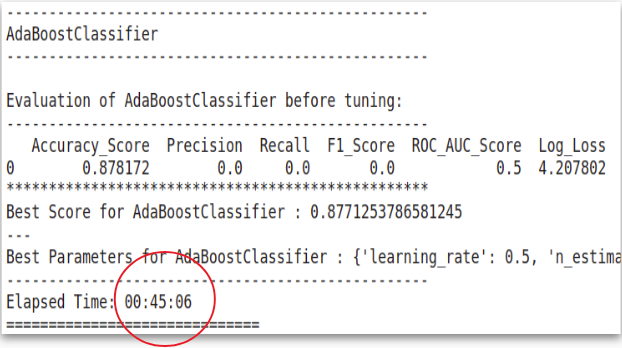



RandomizedSearchCV:

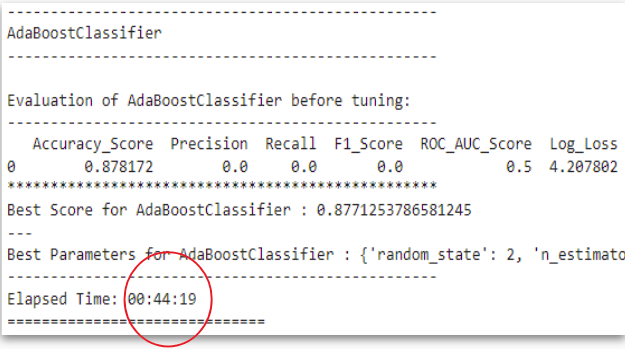


HalvingSearchCV:

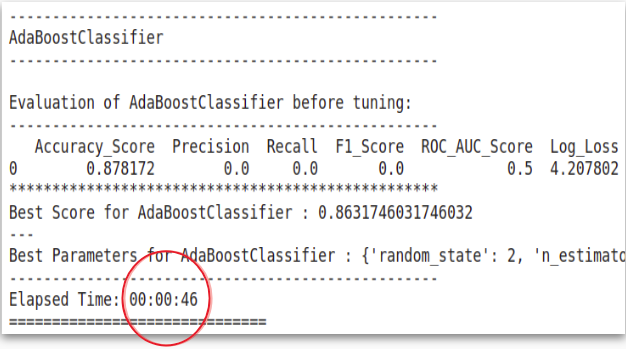


## **Decision Tree**
---
Decision tree is the most powerful and popular tool for *classification* and *prediction*. A Decision tree is a flowchart like tree structure, where each internal node denotes a test on an attribute, each branch represents an outcome of the test, and each leaf node (terminal node) holds a class label.

### ***Hyper-Parameter Tuning:***

> **splitter:** The strategy used to choose the split at each node.

> **max_depth:** The maximum depth of the tree.

> **min_samples_leaf:** The minimum number of samples required to be at a leaf node.

> **min_weight_fraction_leaf:** The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node.

> **max_features:** The number of features to consider when looking for the best split.

> **max_leaf_nodes:** Grow a tree with max_leaf_nodes in best-first fashion.

> **random_state:** Controls the randomness of the estimator.

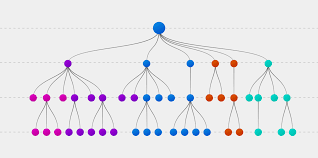

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
DecisionTreeClassifier
--------------------------------------------------

Evaluation of DecisionTreeClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0         0.82551   0.276221  0.266782  0.271419       0.584902  6.289268



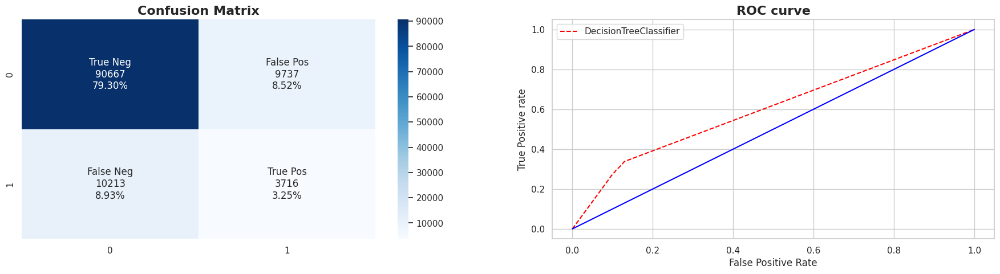

**************************************************
Best Score for DecisionTreeClassifier : 0.8765776981528554 
---
Best Parameters for DecisionTreeClassifier : {'splitter': 'random', 'random_state': 23, 'min_weight_fraction_leaf': 0.3, 'min_samples_leaf': 1, 'max_leaf_nodes': None, 'max_features': None, 'max_depth': 7}
--------------------------------------------------
Elapsed Time: 00:02:44

Evaluation of DecisionTreeClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



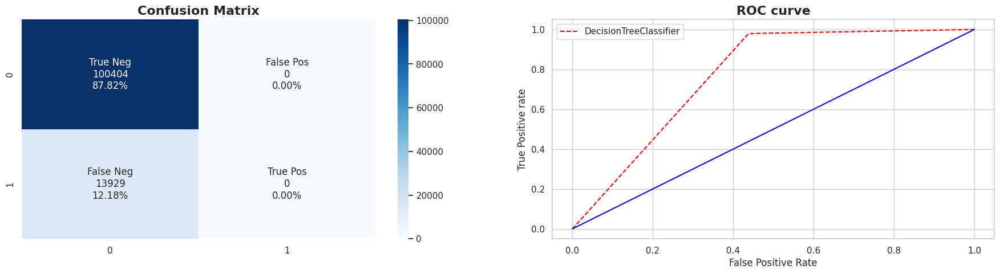

In [ ]:
parameters_decision_tree = {
    "splitter": ["best", "random"],
    "max_depth": [None, 5, 7, 9],
    "min_samples_leaf": [1, 2, 3, 4, 5],
    "min_weight_fraction_leaf": [0.0, 0.3, 0.4, 0.5],
    "max_features": ["log2", "sqrt", None],  # fixed here
    "max_leaf_nodes": [None, 30, 40, 50, 60],
    "random_state": [23]
}


ml_algorithm_implementation(df_processed, DecisionTreeClassifier(), parameters_decision_tree, Tuning_Method, False)

## **Gaussian Naive Bayes**
---
Gaussian Naive Bayes is a variant of Naive Bayes that follows Gaussian normal distribution and supports continuous data. Naive Bayes are a group of supervised machine learning classification algorithms based on the Bayes theorem. It is a simple classification technique, but has high functionality.

### ***Hyper-Parameter Tuning:***

> **var_smoothing:** Portion of the largest variance of all features that is added to variances for calculation stability.

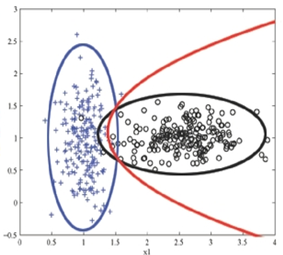

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
GaussianNB
--------------------------------------------------

Evaluation of GaussianNB before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score   Log_Loss
0        0.637445   0.248736  0.978031  0.396605       0.784114  13.067806



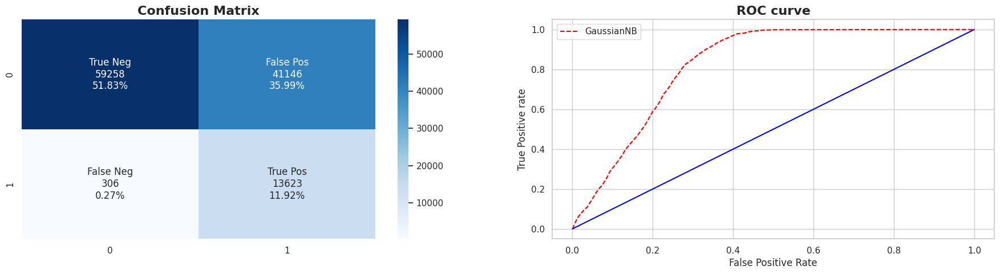

**************************************************
Best Score for GaussianNB : 0.6546993846271452 
---
Best Parameters for GaussianNB : {'var_smoothing': np.float64(1.2328467394420635e-09)}
--------------------------------------------------
Elapsed Time: 00:00:06

Evaluation of GaussianNB after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score   Log_Loss
0        0.637445   0.248736  0.978031  0.396605       0.784114  13.067806



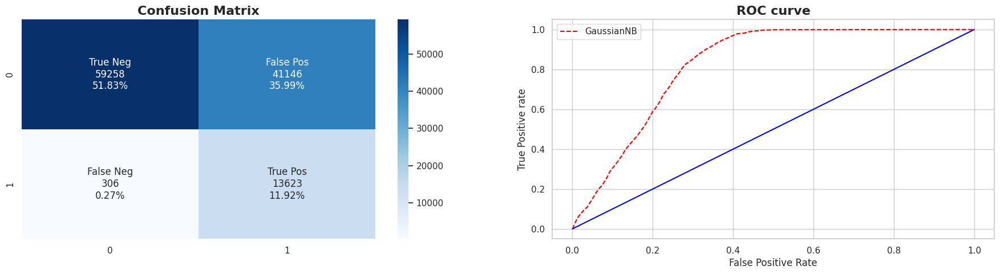

In [ ]:
parameters_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

ml_algorithm_implementation(df_processed, GaussianNB(), parameters_NB, Tuning_Method, False)

## **AdaBoost Classifier**
---
AdaBoost algorithm, short for *Adaptive Boosting*, is a *Boosting* technique used as an *Ensemble Method* in Machine Learning. It is called *Adaptive Boosting* as the weights are re-assigned to each instance, with higher weights assigned to incorrectly classified instances.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** The maximum number of estimators at which boosting is terminated. In case of perfect fit, the learning procedure is stopped early.

> **learning_rate:** Weight applied to each classifier at each boosting iteration.

> **random_state:** Controls the randomness of the estimator.

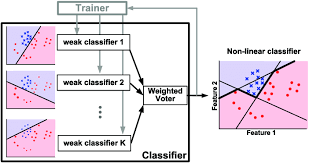

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
AdaBoostClassifier
--------------------------------------------------

Evaluation of AdaBoostClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



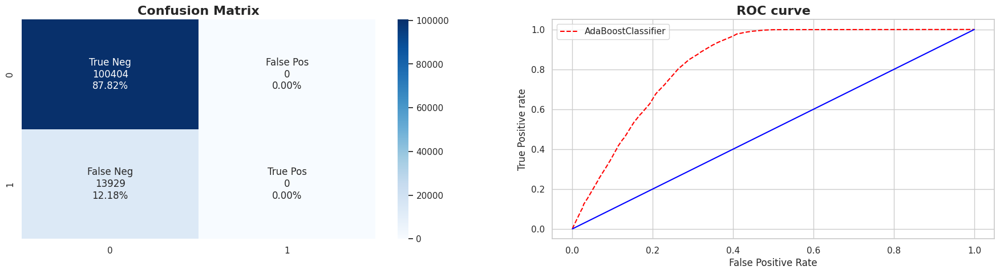

**************************************************
Best Score for AdaBoostClassifier : 0.9036507936507936 
---
Best Parameters for AdaBoostClassifier : {'random_state': 2, 'n_estimators': 400, 'learning_rate': 0.001}
--------------------------------------------------
Elapsed Time: 00:02:05

Evaluation of AdaBoostClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



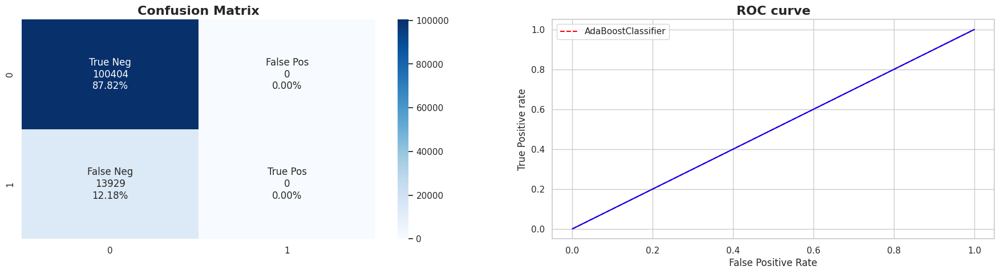

In [ ]:
parameters_ada = {'n_estimators':[10, 100, 200,400],
              'learning_rate':[0.001, 0.01, 0.1, 0.2, 0.5],
              'random_state':[2]}

ml_algorithm_implementation(df_processed, AdaBoostClassifier(), parameters_ada, Tuning_Method, False)

## **Bagging Classifier**
---
A Bagging classifier is an ensemble meta-estimator that fits base classifiers each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** The maximum number of estimators at which boosting is terminated.

> **random_state:** Controls the randomness of the estimator.

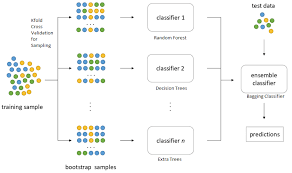

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
BaggingClassifier
--------------------------------------------------

Evaluation of BaggingClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision   Recall  F1_Score  ROC_AUC_Score  Log_Loss
0         0.85293   0.301513  0.15737  0.206802       0.553397  5.300955



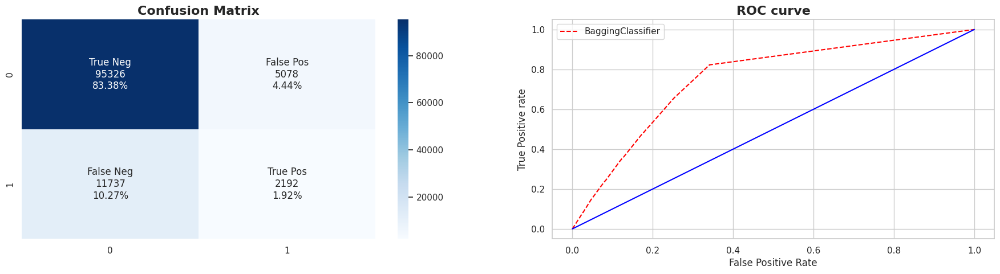

**************************************************
Best Score for BaggingClassifier : 0.8575757575757577 
---
Best Parameters for BaggingClassifier : {'random_state': 26, 'n_estimators': 200}
--------------------------------------------------
Elapsed Time: 00:04:28

Evaluation of BaggingClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision   Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.854312   0.306085  0.15457   0.20541       0.552978  5.251145



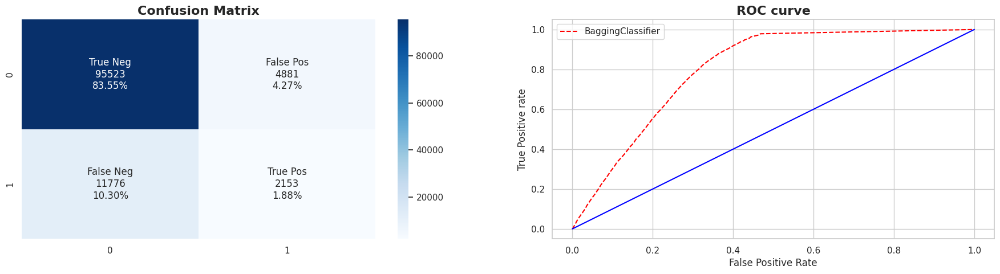

In [ ]:
parameters_bagging = {'n_estimators':[10, 100, 200, 400],
                      'random_state':[26]}

ml_algorithm_implementation(df_processed, BaggingClassifier(), parameters_bagging, Tuning_Method, False)

## **LightGBM Classifier**
---
LightGBM, short for Light Gradient Boosting Machine, is a *distributed gradient boosting framework*.It uses Histogram based splitting, Gradient-based One-Side Sampling (GOSS) ans Exclusive Feature Bundling (EFB) making it a fast algorithm.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** Number of Boosting iterations.

> **learning_rate:** This setting is used for reducing the gradient step. It affects the overall time of training: the smaller the value, the more iterations are required for training.

> **min_data_in_leaf:** Minimal number of data in one leaf. Can be used to deal with over-fitting

> **random_state:** Controls the randomness of the estimator.

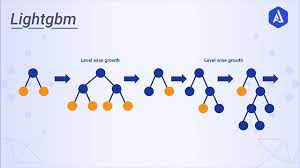

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LGBMClassifier
--------------------------------------------------
[LightGBM] [Info] Number of positive: 32781, number of negative: 233995
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 538
[LightGBM] [Info] Number of data points in the train set: 266776, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.122878 -> initscore=-1.965451
[LightGBM] [Info] Start training from score -1.965451

Evaluation of LGBMClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  

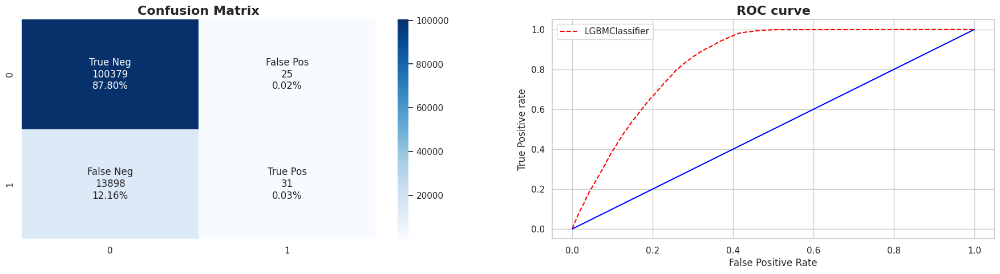

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

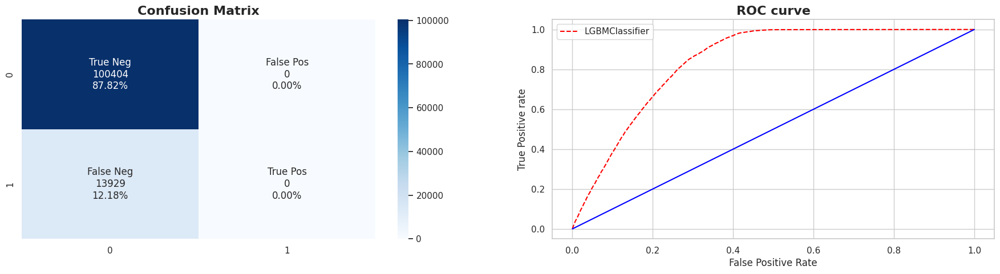

In [ ]:
parameters_lightgbm = {
    'max_depth': list(np.linspace(1, 32, 32, endpoint=True, dtype=int)),
    'min_data_in_leaf':[100, 200, 250, 300],
    'n_estimators':[50,100, 120,150,200],
    'learning_rate':[.001,0.01,.1]
}

ml_algorithm_implementation(df_processed, lgb.LGBMClassifier(), parameters_lightgbm, Tuning_Method, False)

## **Logistic Regression**
---
The logistic classification model is a binary classification model in which the conditional probability of one of the two possible realizations of the output variable is assumed to be equal to a linear combination of the input variables, transformed by the logistic function.

### ***Hyper-Parameter Tuning:***

> **solver:** Algorithm to use in the optimization problem.

> **penalty:** Specify the norm of the penalty.

> **C:** Inverse of regularization strength

> **random_state:** Controls the randomness of the estimator.

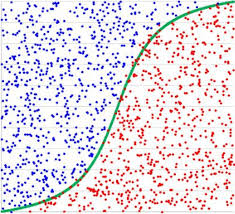

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LogisticRegression
--------------------------------------------------

Evaluation of LogisticRegression before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



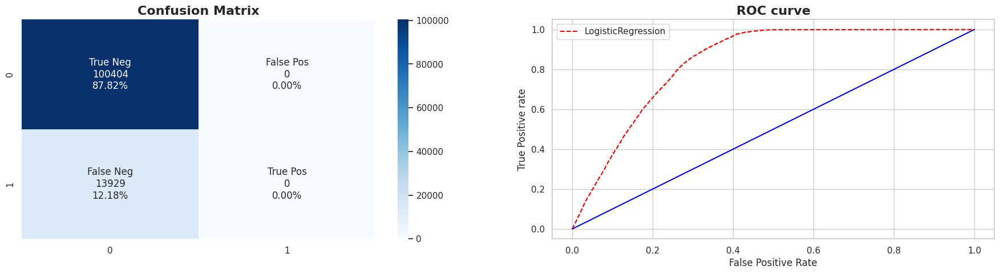

**************************************************
Best Score for LogisticRegression : 0.8824506749740394 
---
Best Parameters for LogisticRegression : {'solver': 'sag', 'random_state': 2, 'penalty': 'l2', 'C': 0.001}
--------------------------------------------------
Elapsed Time: 00:00:06

Evaluation of LogisticRegression after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



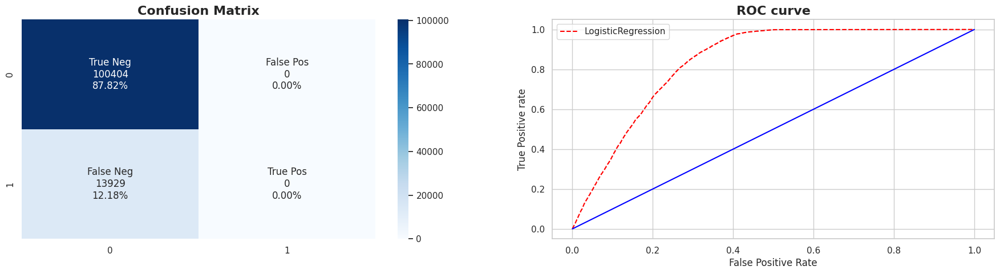

In [ ]:
parameters_logistic = {'solver' : ['newton-cg', 'lbfgs', 'liblinear','sag','saga'],
                        'penalty' : ['l2'],
                        'C' : [100, 10, 1.0, 0.1, 0.01, 0.001],
                       'random_state':[2]}

ml_algorithm_implementation(df_processed, LogisticRegression(), parameters_logistic, Tuning_Method, False)

## **Best Model**
---
From all the above models that we tried to train and predict the output, we can conclude that ***Bagging Classifier*** is the best model for our data set. The best parameter of this model is {'n_estimators': 200}. Its Accuracy Score is 1.0, Precision is 1.0, Recall is 1.0, F1_Score is 1.0, ROC_AUC_Score is 1.0 and Log_Loss is 4.98. Its Elapsed time is 03 minutes and 21 seconds.

We can see that we have other models with higher Accuracy Score than *Bagging Classifier*. But the problem with those models is, their Precision and Recall values are zero which means True Positives are zero. That means those models are unable to predict correct output if any customer is ready to take vehicle insurance. And as we all know, classification accuracy alone can be misleading if you have an unequal number of observations in each class. This is exactly the case with our data set.

*Hence, **Bagging Classifier** is the **best model** for our data set.*

**NOTE:** You might get a slight difference in result every time you run because we are using *Halving_Randomized_Search_CV* to perform hyperparameter tunning which randomly selects the combination of parameters to tune the model.

# **Extracting Feature Importance**
---

We got our best model with its hyper-parameter values. Let's have a look at the feature importance of our data set.

In [ ]:
def feature_plot(importances, X_train, y_train):

    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:5]]
    values = importances[indices][:5]

    # Creat the plot
    fig = plt.figure(figsize = (9,5))
    plt.title("Normalized Weights for First Five Most Predictive Features", fontsize = 16)
    plt.bar(np.arange(5), values, width = 0.2, align="center", color = '#00A000', \
          label = "Feature Weight")
    plt.bar(np.arange(5) - 0.2, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
          label = "Cumulative Feature Weight")
    plt.xticks(np.arange(5), columns)
    plt.xlim((-0.5, 4.5))
    plt.ylabel("Weight", fontsize = 12)
    plt.xlabel("Feature", fontsize = 12)

    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()

def show_feature_importance():
    x_train, y_train, model = ml_algorithm_implementation(df_processed, BaggingClassifier(n_estimators=200, random_state=23),
                                None, None, True)

    importances = np.mean([
        tree.feature_importances_ for tree in model.estimators_
        ], axis=0)
    feature_plot(importances, x_train, y_train)

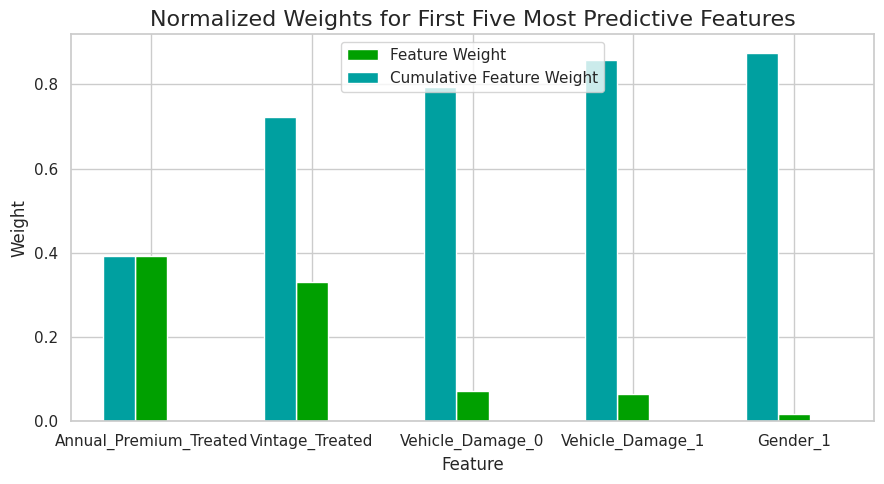

In [ ]:
show_feature_importance()

**Observations:**
- Annual_Premium_Treated has impacted the most in the prediction.
- Gender_Male has highest feature weight but less cumulative weight.

# **Conclusion**
---

Beginning from loading our dataset, we initially checked for null values and duplicates. There were no null values and duplicates identified, therefore, treatment of such was not required. Before data processing, we applied feature scaling techniques to normalize our data to bring all features on the same scale and make it easier to process by ML algorithms.

Through **Exploratory Data Analysis**, we categorized *Age* as YoungAge, MiddleAge, and OldAge, then we categorized the *Region_Code* as Region_A, Region_B, Region_C. We categorized the *Policy_Sales_Channel* into channel_A, channel_B, channel_C. Further, we observed that customers belonging to youngAge are more interested in vehicle response. We observed that customers having vehicles older than 2 years are more likely to be interested in vehicle insurance. Similarly, customers having  damaged vehicles are more likely to be interested in subscribing to vehicle insurance.

For **Feature Selection**, we used Kendall's rank correlation coefficient for numerical features and for categorical features, we applied the Mutual Information technique. Here we observed that Previously_Insured is the most important feature and has the highest impact on the dependent feature and also ensured that there is no correlation between the two numeric features.

Further, we applied **Machine Learning Algorithms** to determine whether a customer would be interested in Vehicle Insurance. For the *Naive Bayes* algorithm, we got an accuracy score of 68% and after hyperparameter tuning, the accuracy score increased to 72%. Similarly, for *Decision Tree Classifier, AdaBoost, BaggingClassifier, LightGBM* accuracy score was obtained around 82%-87%. Therefore, we selected our ***best model*** as the model with an accuracy score of ***85%*** considering precision and recall as we have an unequal number of observations in each class in our dataset, so accuracy alone can be misleading.

*That’s it! We reached the end.*


---

---